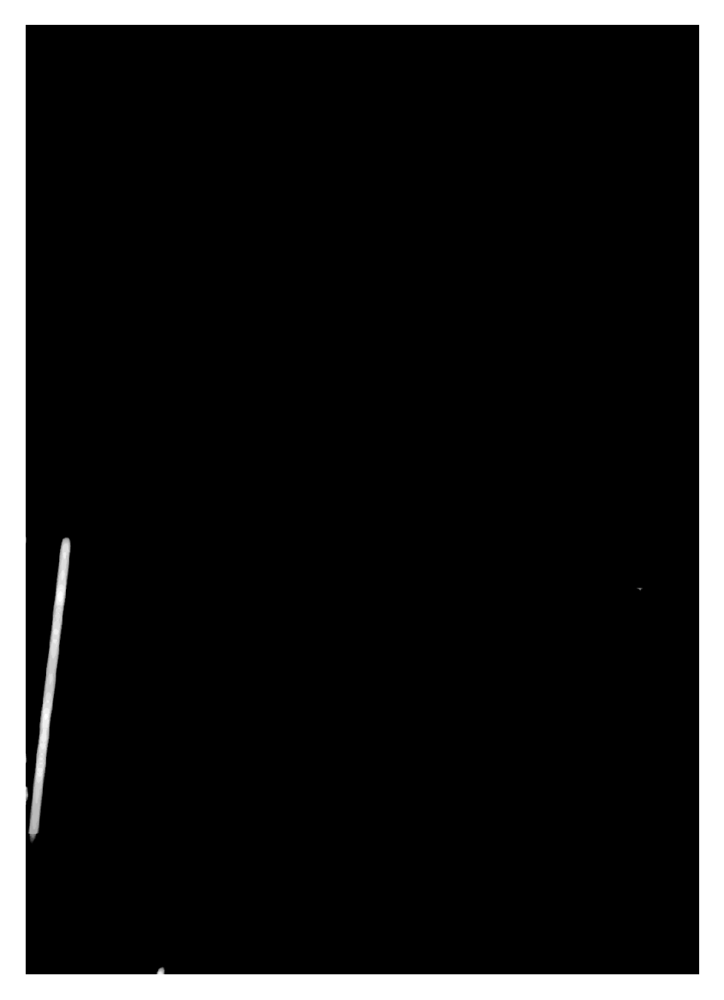

In [9]:
import torch
import numpy as np
import matplotlib.pyplot as plt

img = torch.load(
    "../../../test_data/ts027_tardis.pt", map_location="cpu", weights_only=False
).numpy()
img = np.flip(img, 1)
img = np.where(img >= 0.1, 1, 0).astype(np.uint8)
from tardis_em.utils.export_data import to_mrc

to_mrc(img, 1.0, "../../../test_data/ts027_tardis.mrc")
plt.figure(dpi=300)
plt.axis("off")
plt.imshow(np.sum(img, 0), cmap="gray")

In [4]:
img.dtype

dtype('float16')

In [1]:
from os.path import join
import numpy as np
from tardis_em.cnn.data_processing.draw_mask import draw_instances
from tardis_em.utils.load_data import load_image
import os

dir_ = "unet_4A"
gt_list = [
    i.split("/")[0]
    for i in os.listdir("../../../test_data/mem_2d/GT")
    if i != ".DS_Store"
]
gt_list = sorted(gt_list)
logits_list = [
    i.split("/")[0]
    for i in os.listdir(f"../../../test_data/mem_2d/{dir_}")
    if i not in [".DS_Store", "prediction_log.txt"]
]
logits_list = sorted(logits_list)

logits = [
    load_image(join(f"../../../test_data/mem_2d/{dir_}", i), px_=False)
    for i in logits_list
]
gt = [
    (
        load_image(join("../../../test_data/mem_2d/GT", i), px_=False)
        if not i.endswith(".csv")
        else np.where(
            draw_instances(
                mask_size=logits[id_].shape,
                coordinate=np.genfromtxt(
                    join("../../../test_data/mem_2d/GT", i),
                    delimiter=",",
                    skip_header=1,
                ),
                pixel_size=2.534,
                circle_size=40,
            )
            > 0,
            1,
            0,
        )
    )
    for id_, i in enumerate(gt_list)
]

In [ ]:
from tardis_em.utils.visualize_pc import show_image_list

show_image_list(gt, num_cols=5, dpi=250, title_fontsize=0, figsize=(50, 50))

In [ ]:
from tardis_em.utils.visualize_pc import show_image_list

show_image_list(logits, num_cols=5, dpi=250, title_fontsize=0, figsize=(50, 50))

In [ ]:
from tardis_em.benchmarks.utils import benchmark_cnn

precisions, recall, f1, AP, AP90 = benchmark_cnn(logits, gt, reduce="none")
means = np.mean([precisions, recall, f1, AP, AP90], axis=1)
print(
    f"Model: {dir_} \n"
    f"Precision: {means[0]}; Recall: {means[1]}; F1: {means[2]}\n"
    f"AP: {means[3]}; AP90: {means[4]}"
)

  0%|          | 0/22 [00:00<?, ?it/s]

0


In [1]:
import torch
import numpy as np
import os

imgs = [
    torch.load(os.path.join("../../../test_data/mem_3d/", i), map_location="cpu")
    for i in [j for j in os.listdir("../../../test_data/mem_3d/") if j.endswith(".pt")]
]
imgs[0] = imgs[0][None, :]

/var/folders/rz/cjf5zq354pgc56cqrkb_k4140000gn/T/ipykernel_15760/3740979611.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  imgs = [torch.load(os.path.join('../../../tes

In [2]:
img = torch.concat(imgs).detach().cpu().numpy()

In [10]:
img_max = np.max(img, axis=0)
from tardis_em.utils.normalization import MeanStdNormalize, RescaleNormalize

rescale = RescaleNormalize()
minmax = MeanStdNormalize()

img_max = rescale(img_max)

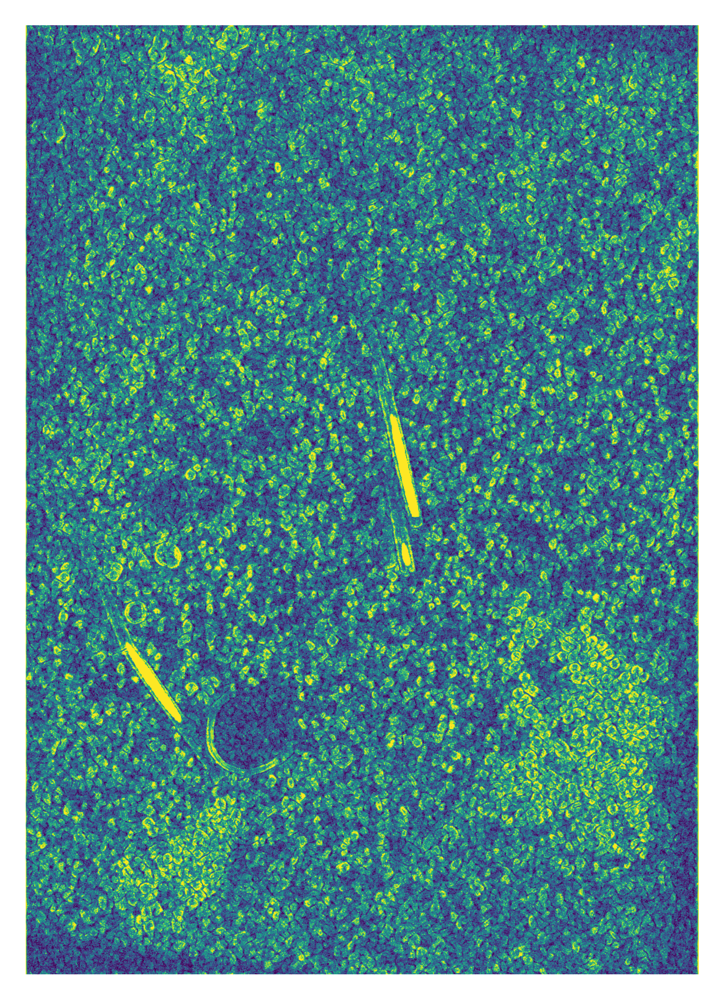

In [11]:
import matplotlib.pyplot as plt

plt.figure(dpi=600)
plt.axis("off")
plt.imshow(img_max[150, :])

In [41]:
import tifffile.tifffile as tif

tif.imwrite("../../../test_data/mem_3d/stack.tif", img_max)